<a href="https://colab.research.google.com/github/bharathts1507/TSAI-Assignments-EVA4/blob/master/S11_Assigment_Solution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# Creating cycles 

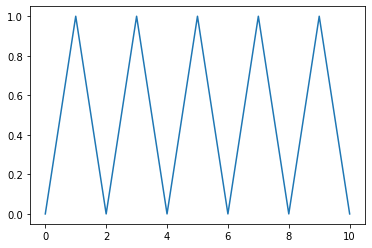

In [2]:
import numpy as np
%matplotlib inline
from matplotlib import pyplot as plt

x=np.array(np.arange(11))
y= x%2

plt.plot(x,y)

In [0]:
#mounting drive to access files and custom libraries

In [3]:
import os
# mount the drive to access libraries and supportive classes
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import sys
sys.path.append("/content/drive/My Drive/TSAI_EVA4/Library/")


In [5]:
!pip install -U git+https://github.com/albu/albumentations > /dev/null && echo "All libraries are successfully installed!"

  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-k3e3xkvg
All libraries are successfully installed!


In [6]:
from torchvision import datasets
train = datasets.CIFAR10('./data', train=True, download=True)

Extracting ./data/cifar-10-python.tar.gz to ./data


In [0]:
# Data Transformations

import cv2
import numpy as np
from datatransforms import AlbumentationTransforms
import albumentations as A
from torchvision import transforms

channel_means = (0.49139968, 0.48215841, 0.44653091)
channel_stdevs = (0.24703223, 0.24348513, 0.26158784)
# Train Phase transformations
train_transforms = AlbumentationTransforms([
                                      A.PadIfNeeded(min_height=40, min_width=40, border_mode=cv2.BORDER_CONSTANT, value=np.array(channel_means)*255),
                                      A.RandomCrop(32,32, always_apply=True),
                                      #A.Rotate((-30.0, 30.0)),
                                      A.HorizontalFlip(),
                                      #A.RGBShift(r_shift_limit=50, g_shift_limit=50, b_shift_limit=50, p=0.5),
                                      A.Normalize(mean=channel_means, std=channel_stdevs),
                                      A.Cutout(num_holes=1, max_h_size=8, max_w_size=8, p=1) # fillvalue is 0 after normalizing as mean is 0
                                    ])

fillmeans = (np.array(channel_means)).astype(np.uint8)

# Test Phase transformations
test_transforms = AlbumentationTransforms([A.Normalize(mean=channel_means, std=channel_stdevs)])

In [8]:
#Loading Train and Test data
from torchvision import datasets
train = datasets.CIFAR10('./data', train=True, download=True, transform=train_transforms)
test = datasets.CIFAR10('./data', train=False, download=True, transform=test_transforms)

Files already downloaded and verified
Files already downloaded and verified


In [0]:
import dataloaders
batch_size=512

dataloader = dataloaders.DataLoader(batch_size=batch_size)

# train dataloader
train_loader = dataloader.load(train)

# test dataloader
test_loader = dataloader.load(test)

In [10]:
#Model Creation
from models.s11net import S11Net
import torch
model = S11Net()
use_cuda = torch.cuda.is_available()
model.device = torch.device("cuda" if use_cuda else "cpu")
model.to(model.device)
model.summary((3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
              ReLU-3           [-1, 64, 32, 32]               0
            Conv2d-4          [-1, 128, 32, 32]          73,728
       BatchNorm2d-5          [-1, 128, 16, 16]             256
            Conv2d-6          [-1, 128, 16, 16]         147,456
       BatchNorm2d-7          [-1, 128, 16, 16]             256
            Conv2d-8          [-1, 128, 16, 16]         147,456
       BatchNorm2d-9          [-1, 128, 16, 16]             256
         ResBlock-10          [-1, 128, 16, 16]               0
         S11Block-11          [-1, 128, 16, 16]               0
           Conv2d-12          [-1, 256, 16, 16]         294,912
      BatchNorm2d-13            [-1, 256, 8, 8]             512
         S11Block-14            [-1, 25

  pip install torch-lr-finder -v --global-option="amp"



Learning rate search finished. See the graph with {finder_name}.plot()


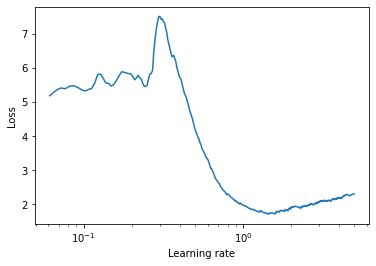

In [11]:
# LR finder
import torch.nn as nn
import torch.nn.functional as F
from LRFinder import LRFinder
import torch.optim as optim
torch.autograd.set_detect_anomaly(True)

L1lambda = 0
L2lambda = 1e-4
criterion = F.nll_loss
optimizer = optim.SGD(model.parameters(),  lr=1e-7, weight_decay=1e-2)

lr_finder = LRFinder(model, optimizer, criterion, device=model.device)
lr_finder.range_test(train_loader, end_lr=5, num_iter=len(train_loader)*10, step_mode='linear') #len(train_loader)*10
lr_finder.plot() 
lr_finder.reset() 

In [12]:
loss = lr_finder.history['loss']
lr = lr_finder.history['lr']
print(lr[loss.index(min(loss))])

1.4336735407142858


In [0]:

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly import graph_objs as go

def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [0]:
def plotly_plot(x, y, title = '', xscale='linear', yscale='linear'):
    enable_plotly_in_cell()
    data = []
    trace = go.Scatter(
            x = x,
            y = y,
            mode = 'lines',
            name = title
      )
    data.append(trace)
    
    layout = dict(title = title, yaxis_type=yscale, xaxis_type=xscale)
    fig = dict(data = data, layout = layout)
    iplot(fig, show_link=False)

In [15]:
plotly_plot(lr, loss, "LR Range")

In [16]:

max_lr = lr[loss.index(min(loss))]
max_lr

1.4336735407142858

In [17]:
#Developing model using Resnet module

import torch.optim as optim
import torch.nn as nn
batch_size=512
#from torch.optim.lr_scheduler import StepLR
#optimizer = torch.optim.SGD(model.parameters(), lr=0.08, momentum=0.95, weight_decay=1e-4)
L1lambda = 0
L2lambda = 0
EPOCHS = 24
max_lr = 0.1
optimizer = optim.SGD(model.parameters(), lr=max_lr/100, weight_decay=L2lambda)
# scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr, steps_per_epoch=len(train_loader), div_factor=5, pct_start=0.2, epochs=EPOCHS)
# scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr, steps_per_epoch=int(len(train)/batch_size)+1, epochs=EPOCHS,  pct_start=5/24, div_factor=100, final_div_factor=1 )
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=max_lr, steps_per_epoch=int(len(train_loader))+1, epochs=EPOCHS,  pct_start=0.2, div_factor=100, final_div_factor=1 )
print("Initial LR- ",scheduler.get_lr())
print("Total steps - ", scheduler.total_steps)
print("No.of steps to increase LR -", scheduler.step_size_up)
print("No.of steps to reduce LR - ", scheduler.step_size_down)

model.gotrain(optimizer, train_loader, test_loader, EPOCHS, "/content/drive/My Drive/TSAI_EVA4/Session 11/", scheduler, True,L1lambda)

Initial LR-  [0.0010000000000000009]
Total steps -  2376
No.of steps to increase LR - 474.20000000000005
No.of steps to reduce LR -  1900.8



Validation loss decreased (100000.000000 --> 1.863911).  Saving model ...
Epoch: 1, Train set: Average loss: 0.0034, Accuracy: 38.42%; Test set: Average loss: 1.8639, Accuracy: 47.71%
Learning Rate = 0.011072



Epoch: 2, Train set: Average loss: 0.0036, Accuracy: 47.93%; Test set: Average loss: 2.6069, Accuracy: 45.54%
Learning Rate = 0.037188



Validation loss decreased (1.863911 --> 1.764848).  Saving model ...
Epoch: 3, Train set: Average loss: 0.0027, Accuracy: 59.96%; Test set: Average loss: 1.7648, Accuracy: 56.90%
Learning Rate = 0.068721



Validation loss decreased (1.764848 --> 1.101898).  Saving model ...
Epoch: 4, Train set: Average loss: 0.0024, Accuracy: 65.53%; Test set: Average loss: 1.1019, Accuracy: 63.68%
Learning Rate = 0.092840



Validation loss decreased (1.101898 --> 0.941596).  Saving model ...
Epoch: 5, Train set: Average loss: 0.0019, Accuracy: 72.23%; Test set: Average loss: 0.9416, Accuracy: 71.90%
Learning Rate = 0.099983



Validation loss decreased (0.941596 --> 0.699710).  Saving model ...
Epoch: 6, Train set: Average loss: 0.0013, Accuracy: 78.87%; Test set: Average loss: 0.6997, Accuracy: 76.94%
Learning Rate = 0.099127



Validation loss decreased (0.699710 --> 0.640184).  Saving model ...
Epoch: 7, Train set: Average loss: 0.0012, Accuracy: 80.84%; Test set: Average loss: 0.6402, Accuracy: 80.64%
Learning Rate = 0.096998



Epoch: 8, Train set: Average loss: 0.0010, Accuracy: 83.31%; Test set: Average loss: 0.7234, Accuracy: 80.99%
Learning Rate = 0.093652



Validation loss decreased (0.640184 --> 0.532208).  Saving model ...
Epoch: 9, Train set: Average loss: 0.0009, Accuracy: 84.50%; Test set: Average loss: 0.5322, Accuracy: 82.97%
Learning Rate = 0.089176



Validation loss decreased (0.532208 --> 0.448576).  Saving model ...
Epoch: 10, Train set: Average loss: 0.0008, Accuracy: 86.35%; Test set: Average loss: 0.4486, Accuracy: 85.63%
Learning Rate = 0.083688



Epoch: 11, Train set: Average loss: 0.0007, Accuracy: 87.56%; Test set: Average loss: 0.4655, Accuracy: 85.25%
Learning Rate = 0.077331



Validation loss decreased (0.448576 --> 0.415592).  Saving model ...
Epoch: 12, Train set: Average loss: 0.0007, Accuracy: 88.36%; Test set: Average loss: 0.4156, Accuracy: 86.62%
Learning Rate = 0.070271



Validation loss decreased (0.415592 --> 0.377533).  Saving model ...
Epoch: 13, Train set: Average loss: 0.0006, Accuracy: 89.20%; Test set: Average loss: 0.3775, Accuracy: 87.47%
Learning Rate = 0.062694



Validation loss decreased (0.377533 --> 0.352979).  Saving model ...
Epoch: 14, Train set: Average loss: 0.0005, Accuracy: 90.40%; Test set: Average loss: 0.3530, Accuracy: 88.61%
Learning Rate = 0.054798



Epoch: 15, Train set: Average loss: 0.0005, Accuracy: 91.46%; Test set: Average loss: 0.3831, Accuracy: 87.70%
Learning Rate = 0.046789



Epoch: 16, Train set: Average loss: 0.0004, Accuracy: 92.24%; Test set: Average loss: 0.3596, Accuracy: 88.62%
Learning Rate = 0.038878



Epoch: 17, Train set: Average loss: 0.0004, Accuracy: 92.97%; Test set: Average loss: 0.3630, Accuracy: 88.42%
Learning Rate = 0.031270



Epoch: 18, Train set: Average loss: 0.0004, Accuracy: 93.41%; Test set: Average loss: 0.4572, Accuracy: 86.46%
Learning Rate = 0.024166



Validation loss decreased (0.352979 --> 0.316659).  Saving model ...
Epoch: 19, Train set: Average loss: 0.0003, Accuracy: 94.37%; Test set: Average loss: 0.3167, Accuracy: 90.45%
Learning Rate = 0.017752



Epoch: 20, Train set: Average loss: 0.0003, Accuracy: 95.31%; Test set: Average loss: 0.3415, Accuracy: 89.73%
Learning Rate = 0.012194



Validation loss decreased (0.316659 --> 0.309921).  Saving model ...
Epoch: 21, Train set: Average loss: 0.0002, Accuracy: 95.94%; Test set: Average loss: 0.3099, Accuracy: 90.86%
Learning Rate = 0.007640



Validation loss decreased (0.309921 --> 0.304307).  Saving model ...
Epoch: 22, Train set: Average loss: 0.0002, Accuracy: 96.51%; Test set: Average loss: 0.3043, Accuracy: 91.13%
Learning Rate = 0.004207



Validation loss decreased (0.304307 --> 0.303255).  Saving model ...
Epoch: 23, Train set: Average loss: 0.0002, Accuracy: 96.77%; Test set: Average loss: 0.3033, Accuracy: 90.96%
Learning Rate = 0.001987



Validation loss decreased (0.303255 --> 0.301996).  Saving model ...
Epoch: 24, Train set: Average loss: 0.0002, Accuracy: 96.96%; Test set: Average loss: 0.3020, Accuracy: 91.22%
Learning Rate = 0.001036



In [18]:
for idx, group in enumerate(scheduler.optimizer.param_groups):
  print(group['initial_lr'], group['max_lr'], group['min_lr'])

0.001 0.1 0.001


In [19]:
print(max(model.stats().train_acc))
print(max(model.stats().test_acc))

0.96956
0.9122


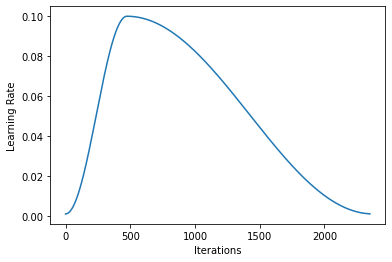

In [20]:
plt.xlabel("Iterations")
plt.ylabel("Learning Rate")
plt.plot(model.stats().batch_lr)
plt.show()

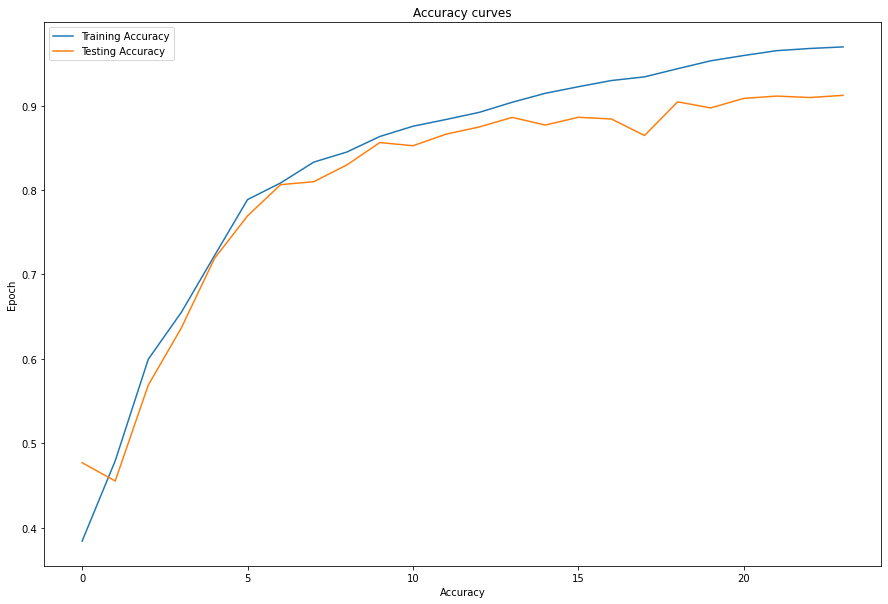

In [21]:
#Plotting Accuracy curves for train and test

plt.figure(figsize=(15, 10))
ax = plt.subplot(111)
ax.plot(model.stats().train_acc)
ax.plot(model.stats().test_acc)

ax.set(title="Accuracy curves", xlabel="Accuracy", ylabel="Epoch")
ax.legend(['Training Accuracy', 'Testing Accuracy'], loc='best')
plt.savefig("TrainTestAccuracy.png")
plt.show()

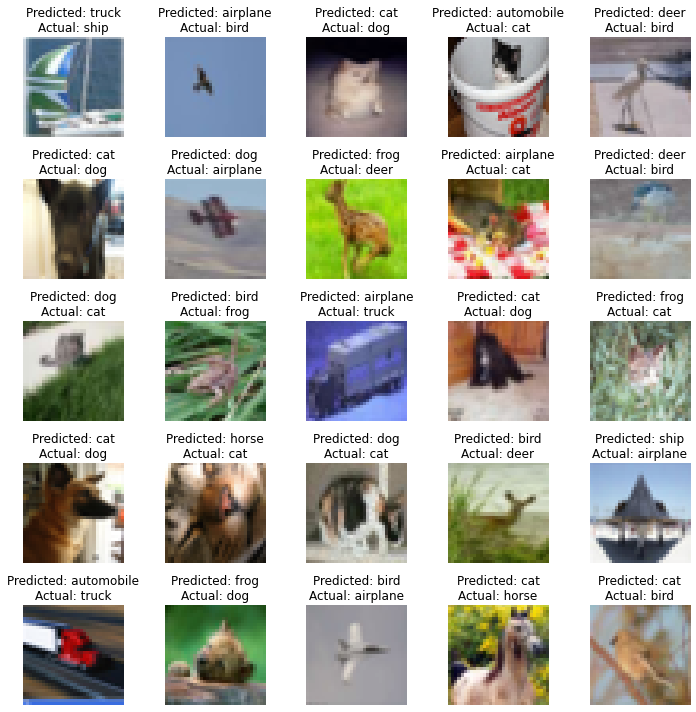

In [23]:
#misclassified Classes
import plots

num_classes = 10
# display 10 images from each category. 
class_names = ['airplane','automobile','bird','cat','deer',
               'dog','frog','horse','ship','truck']

plots.plot_images(model.stats().get_misclassified_images(), class_names, "misclassified_imgs.png", mean=list(channel_means), std=list(channel_stdevs))


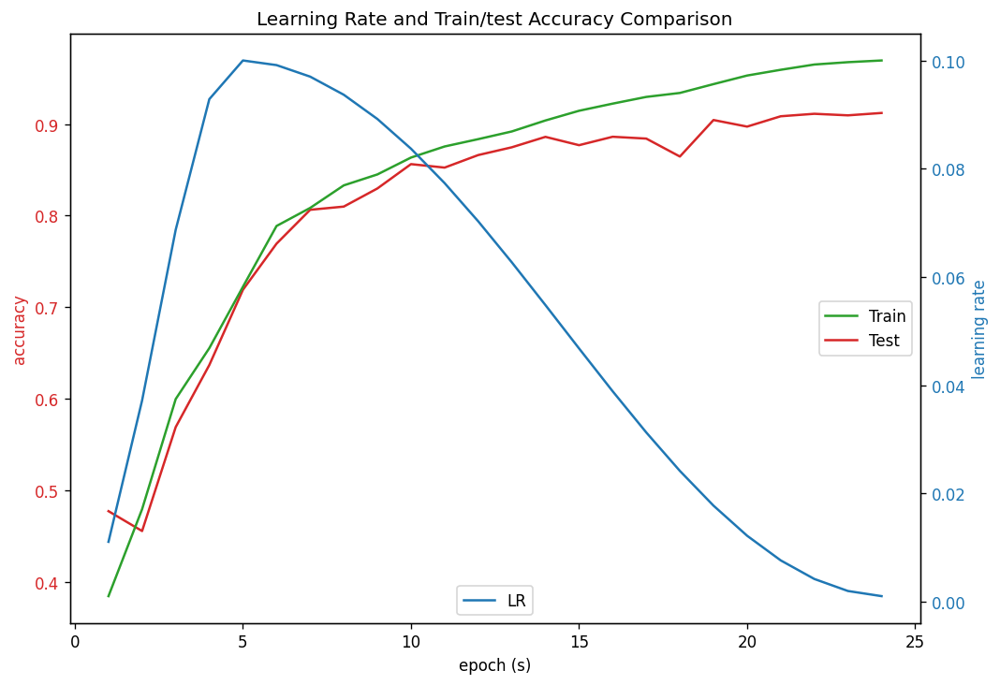

In [24]:
plt.rcParams.update({'figure.figsize':(9,6), 'figure.dpi':120})
fig, ax1 = plt.subplots()
t = np.arange(1, 25)
color = 'tab:red'
ax1.set_xlabel('epoch (s)')
ax1.set_ylabel('accuracy', color=color)
testline, = ax1.plot(t, model.stats().test_acc, color=color)
ax1.tick_params(axis='y', labelcolor=color)

color = 'tab:green'
trainline, = ax1.plot(t, model.stats().train_acc, color=color)
ax1.legend((trainline, testline), ('Train', 'Test'), loc=7)
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('learning rate', color=color)  # we already handled the x-label with ax1
lrline, = ax2.plot(t, model.stats().lr, color=color)
ax2.legend((lrline, ), ('LR',), loc=8)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title("Learning Rate and Train/test Accuracy Comparison")
plt.show()

In [0]:
mimages = model.stats().get_misclassified_images()
images = []
target_classes = []
pred_classes = []
for i in mimages:
  images.append(i["img"].cpu())
  target_classes.append(int(i['target']))
  pred_classes.append(int(i['pred']))

torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3


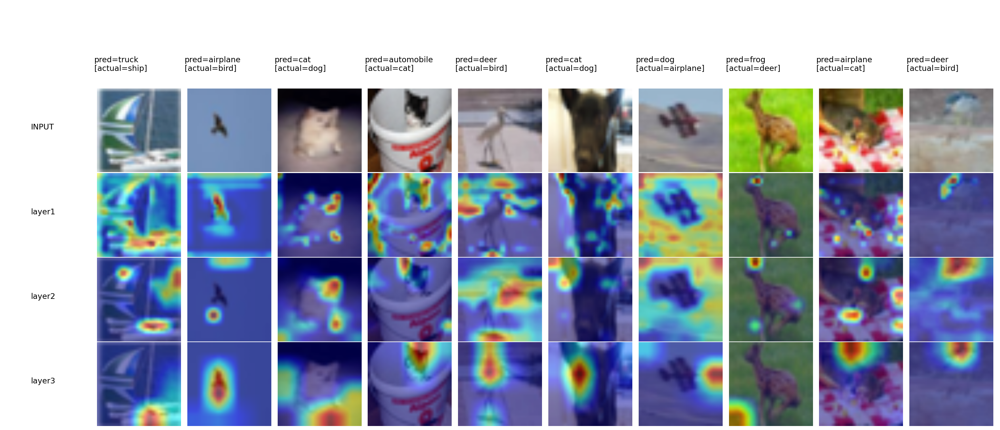

torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3


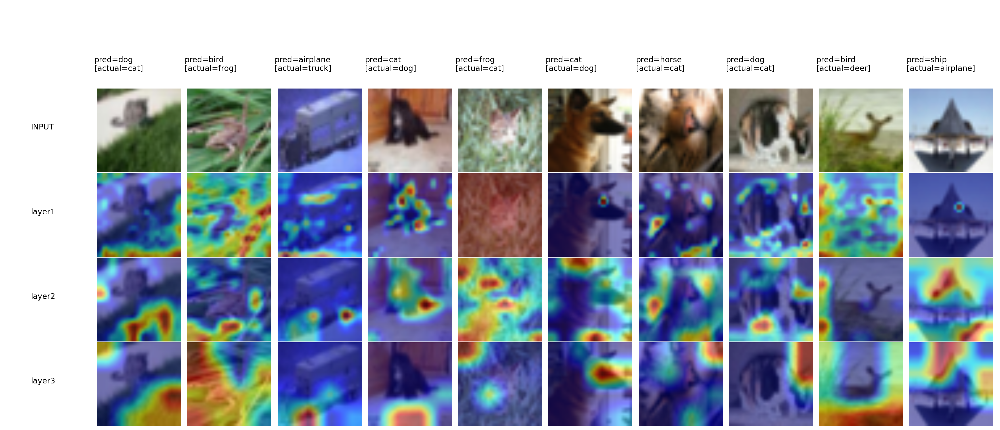

torch.Size([5, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3


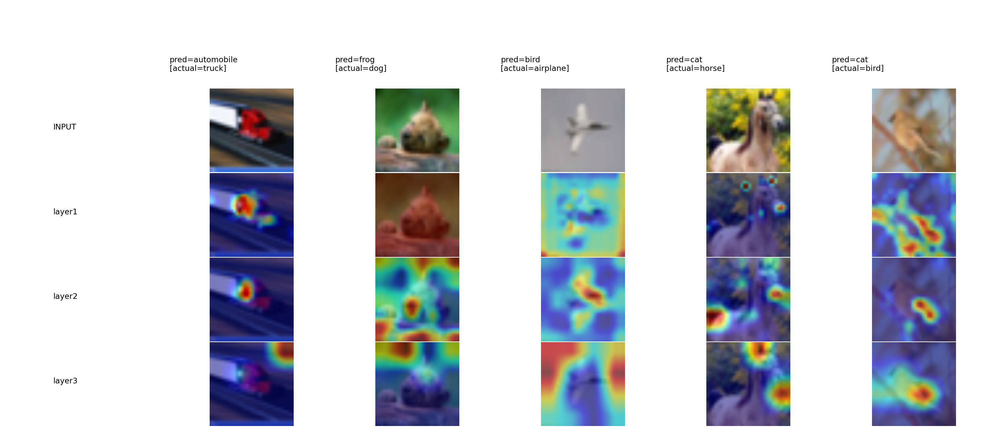

In [28]:
def unnormalize(img):
  img = img.cpu().numpy().astype(dtype=np.float32)
  
  for i in range(img.shape[0]):
    img[i] = (img[i]*channel_stdevs[i])+channel_means[i]
  
  return np.transpose(img, (1,2,0))


from gradcam import GRADCAM, PLOT
target_layers = ["layer1", "layer2", "layer3"]
#Gradcam plot for first 10 misclassified images
gradcam_output, probs, predicted_classes = GRADCAM(images[:10], target_classes[:10], model, target_layers)
PLOT(gradcam_output, images[:10], target_classes[:10], target_layers, class_names, (3, 32, 32), predicted_classes, unnormalize)
#Gradcam plot for 11-20 misclassified images
gradcam_output, probs, predicted_classes = GRADCAM(images[10:20], target_classes[10:20], model, target_layers)
PLOT(gradcam_output, images[10:20], target_classes[10:20], target_layers, class_names, (3, 32, 32), predicted_classes, unnormalize)
#Gradcam plot for 21-25 misclassified images
gradcam_output, probs, predicted_classes = GRADCAM(images[20:], target_classes[20:], model, target_layers)
PLOT(gradcam_output, images[20:], target_classes[20:], target_layers, class_names, (3, 32, 32), predicted_classes, unnormalize)
